# Training P-VAE, VAE, and VGG19bn models from Geo dataset
### Loading functions

In [2]:
# Library imports
import numpy as np
import matplotlib.pyplot as plt
import torch
import torch.nn as nn
from torch.utils.data import TensorDataset, DataLoader
import random
import math
import datetime
import time
import argparse
import os
import csv
import sys
from itertools import combinations_with_replacement, product
import torch
import torchvision
from torch.nn import functional as F
from sklearn.metrics import accuracy_score
from sklearn.metrics.pairwise import cosine_similarity
from sklearn.model_selection import train_test_split
from torch.utils.data import Dataset, DataLoader
import torchvision.transforms as transforms
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

# File imports
from utility import run_training, run_epoch, fc_net, EarlyStopper
from VAE import FourLayerCVAE, train_autoencoder, encode_data
from perceptual_networks import SimpleExtractor, architecture_features
from perceptual_embedder import FeaturePredictorCVAE, FeatureAutoencoder, \
    PerceptualFeatureToImgCVAE, FeatureToImgCVAE

# Dataset imports
from dataset_loader import split_data, load_lunarlander_data, \
    load_svhn_data, load_stl_data

# Global vars
min_iter_early_stopper = 3

### Initializations

In [3]:
args = argparse.ArgumentParser()
# Namespace(ae_batch_size=512, ae_epochs=50, ae_gammas=[0.0, 0.01], ae_networks=['FourLayerCVAE'], ae_repetitions=1,
#           ae_zs=[64, 128], autoencoder_index='autoencoder_index.csv', data='svhn', perceptual_layers=[5],
#           perceptual_nets=['None', 'alexnet'], predictor_batch_size=512, predictor_epochs=500,
#           predictor_repetitions=1, results_path='results.csv')
args.data = 'geo';                      args.data_path = 'C:/Project_Data/'
# AE
args.display_img_feat = 1  # false or epoch number to show >= num
args.ae_epochs = 500;                        args.ae_batch_size = 512;
args.ae_networks = ['FourLayerCVAE'];       args.ae_repetitions = 1;
args.ae_zs = [64, 128];                     args.ae_gammas = [0.01]
# Predictor
args.predictor_epochs = 2;              args.predictor_batch_size = 512;
args.predictor_repetitions = 1;
# Perceptual
args.perceptual_nets = ['alexnet'];        args.perceptual_layers = [5];
# out_files
i = 0; fname = 'autoencoder_index_{:0>3d}.csv'
while os.path.exists(fname.format(i)): i += 1; args.autoencoder_index = fname.format(i)
i = 0; fname = 'results_{:0>3d}.csv'
while os.path.exists(fname.format(i)): i += 1; args.results_path = fname.format(i)


### Create data (Normalization, resizing, encoding, and divide to 90% train (26998) and 10% validation (3000))

In [1]:
from experiment_my import create_data
train_data, train_label, valid_data, valid_label, f_train, f_test = create_data(save=False)
print('train data shape: {}'.format(train_data.shape))
print('validation data shape: {}'.format(valid_data.shape))

  1%|█▍                                                                                                                                                                                        | 222/29998 [00:00<00:13, 2198.12it/s]

resize images using BICUBIC to : (64, 64)


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 29998/29998 [00:10<00:00, 2865.51it/s]


Data Type: uint8
Min: 0.000, Max: 255.000 of pixel value
Normalizing image pixel values to the range of 0-1 ...
Min: 0.000, Max: 1.000 of pixel value
One-Hot encoding data labels
converting into Torch Tensor
train data shape: torch.Size([26998, 3, 64, 64])
validation data shape: torch.Size([3000, 3, 64, 64])


## A. Perceptual VAE
### I. Training Alexnet for using in Perceptual Module on Geo dataset

In [1]:
import torch
import torchvision
from torch.nn import functional as F
from sklearn.metrics import accuracy_score
from sklearn.metrics.pairwise import cosine_similarity
from sklearn.model_selection import train_test_split
from torch.utils.data import Dataset, DataLoader
import torchvision.transforms as transforms
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from torch.utils.tensorboard import SummaryWriter
import time
import argparse
import os
import csv
import numpy as np
import torch.nn as nn
from torch.utils.data import TensorDataset, DataLoader
from itertools import combinations_with_replacement, product
import torch
from main_pvae import extract_data

args = argparse.ArgumentParser()
# Namespace(ae_batch_size=512, ae_epochs=50, ae_gammas=[0.0, 0.01], ae_networks=['FourLayerCVAE'], ae_repetitions=1,
#           ae_zs=[64, 128], autoencoder_index='autoencoder_index.csv', data='svhn', perceptual_layers=[5],
#           perceptual_nets=['None', 'alexnet'], predictor_batch_size=512, predictor_epochs=500,
#           predictor_repetitions=1, results_path='results.csv')
args.data = 'geo';                      args.data_path = 'C:/Project_Data/'
# AE
args.display_img_feat = 1  # false or epoch number to show >= num
args.ae_epochs = 30;                        args.ae_batch_size = 512;
args.ae_networks = ['FourLayerCVAE'];       args.ae_repetitions = 1;
args.ae_zs = [64, 128];                     args.ae_gammas = [0.01]
# Predictor
args.predictor_epochs = 2;              args.predictor_batch_size = 512;
args.predictor_repetitions = 1;
# Perceptual
args.perceptual_nets = ['None'];        args.perceptual_layers = [5];
# out_files
i = 0; fname = 'autoencoder_index_{:0>3d}.csv'
while os.path.exists(fname.format(i)): i += 1; args.autoencoder_index = fname.format(i)
i = 0; fname = 'results_{:0>3d}.csv'
while os.path.exists(fname.format(i)): i += 1; args.results_path = fname.format(i)


model = torchvision.models.alexnet(pretrained=False, progress=True)
if True:
    mod = list(model.classifier.children())
    mod.pop();
    mod.append(torch.nn.Linear(4096, 6))
    new_classifier = torch.nn.Sequential(*mod)
    model.classifier = new_classifier

gpu = True

def visualize(model, input_size=(3, 224, 224)):
    '''Visualize the input size though the layers of the model'''
    x = torch.zeros(input_size).unsqueeze_(dim=0)
    print(x.size())
    for layer in list(model.features) + list(model.avgpool) + list(model.classifier):
        x = layer(x)
        print(x.size())

### https://stackoverflow.com/questions/49433936/how-to-initialize-weights-in-pytorch
## takes in a module and applies the specified weight initialization
def weights_init_normal(m):
    '''Takes in a module and initializes all linear layers with weight
       values taken from a normal distribution.'''

    classname = m.__class__.__name__
    # for every Linear layer in a model
    if classname.find('Linear') != -1:
        y = m.in_features
        # m.weight.data shoud be taken from a normal distribution
        m.weight.data.normal_(0.0, 1 / np.sqrt(y))
        # m.bias.data should be 0
        m.bias.data.fill_(0)

# takes in a module and applies the specified weight initialization
def weights_init_uniform_rule(m):
    classname = m.__class__.__name__
    # for every Linear layer in a model..
    if classname.find('Linear') != -1:
        # get the number of the inputs
        n = m.in_features
        y = 1.0 / np.sqrt(n)
        m.weight.data.uniform_(-y, y)
        m.bias.data.fill_(0)

def loss(output, x):
    # rec_x, z, mu, logvar = output
    # if perceptual_loss:
    #     x = perceptual_net(x)
    #     rec_x = perceptual_net(rec_x)
    # else:
    x = x.reshape(x.size(0), -1)
    rec_x = output.view(x.size(0), -1)
    REC = F.mse_loss(rec_x, x, reduction='mean')

    # if variational:
    #     KLD = -1 * torch.mean(1 + logvar - mu.pow(2) - logvar.exp())
    #     return REC + self.gamma * KLD, REC, KLD
    # else:
    return [REC]

model.apply(weights_init_uniform_rule)
loss_func = nn.CrossEntropyLoss()

lr = .0005
optimizer = torch.optim.Adam(model.parameters(), lr=lr)
if gpu:
    model.cuda()
    loss_func.cuda()
batch_size = args.ae_batch_size
batch_size = 128
args.ae_epochs = 50

class GeoDataLoader(Dataset):
    def __init__(self, images, labels, transform=None):
        self.images = images
        self.labels = labels
        self.transform = transform

    def __len__(self):
        return len(self.labels)

    def __getitem__(self, index):
        image = self.images[index]
        label = self.labels[index]
        if self.transform:
            image = self.transform(image)

        return (image, label)

train_transform = transforms.Compose([
    transforms.ToPILImage(),
    transforms.RandomHorizontalFlip(0.5),
    transforms.RandomVerticalFlip(0.5),
    # transforms.RandomRotation(degrees=(0,360)),
    transforms.ToTensor()])

valid_transform = transforms.Compose([
    transforms.ToPILImage(),
    transforms.ToTensor()])

train_data, train_labels, valid_data, valid_labels, f_train, f_test = extract_data(args)
# train_data = TensorDataset(train_data, train_labels)
train_set = GeoDataLoader(images=train_data, labels=train_labels, transform=train_transform)
trainloader = DataLoader(train_set, batch_size, shuffle=True)
# valid_data = TensorDataset(valid_data, valid_labels)
valid_set = GeoDataLoader(images=valid_data, labels=valid_labels, transform=valid_transform)
validloader = DataLoader(valid_set, batch_size, shuffle=True)

def run_epoch(dataloader, loss, train, epoch_name, gpu=True):
    start_time = time.time()
    epoch_losses = []
    accuracy_epoch = []
    for batch_id, (batch_data, batch_labels) in enumerate(dataloader):
        if train:
            model.train()
        else:
            model.eval()
        if gpu:
            batch_data = batch_data.cuda()
            batch_labels = batch_labels.cuda()
        optimizer.zero_grad()
        output = model(batch_data)

        preds = torch.max(output, 1)[1]
        accuracy = accuracy_score(preds.cpu(), torch.max(batch_labels.cpu(), 1)[1])
        losses = loss_func(output, torch.max(batch_labels, 1)[1])
        losses.backward()
        epoch_losses.append(losses.item())
        if train:
            optimizer.step()
        print(
            '\r{} - [{}/{}] - Losses: {}, Accuracy: {:.2%}, Time elapsed: {}s'.format(
                epoch_name, batch_id + 1, len(dataloader),
                ''.join('{0:.5f}'.format(losses)), accuracy,
                '{0:.1f}'.format(time.time() - start_time)
            ), end=''
        )
        accuracy_epoch.append(accuracy)
    avg_acc_epoch = np.mean(accuracy_epoch)
    print('\tAverage Accuracy {}: {:.2%}'.format(epoch_name, avg_acc_epoch))
    return avg_acc_epoch

for epoch in range(1, args.ae_epochs + 1):
    train_acc_epoch = run_epoch(dataloader=trainloader, loss=loss, train=True,
                                epoch_name='Train EPOCH {}'.format(epoch))
    # writer.add_scalar("Train_accuracy", train_acc_epoch, epoch)

    val_acc_epoch = run_epoch(dataloader=validloader, loss=loss, train=False,
                              epoch_name='Val   EPOCH {}'.format(epoch))
    # writer.add_scalar("Test_accuracy", val_acc_epoch, epoch)

    # print(
    #     f'\rEpoch {epoch} - '
    #     f'Train loss {training_losses[0]:.5f} - '
    #     f'Validation loss {validation_losses[0]:.5f}',
    #     ' ' * 35
    # )
# writer.flush()
torch.save(model.state_dict(), 'model_alexnet.pth')
pass

Train EPOCH 1 - [211/211] - Losses: 0.32237, Accuracy: 88.14%, Time elapsed: 43.4s	Average Accuracy Train EPOCH 1: 65.92%
Val   EPOCH 1 - [24/24] - Losses: 0.51909, Accuracy: 83.93%, Time elapsed: 2.9s	Average Accuracy Val   EPOCH 1: 86.57%
Train EPOCH 2 - [211/211] - Losses: 0.23691, Accuracy: 94.07%, Time elapsed: 42.1s	Average Accuracy Train EPOCH 2: 89.60%
Val   EPOCH 2 - [24/24] - Losses: 0.44697, Accuracy: 82.14%, Time elapsed: 2.9s	Average Accuracy Val   EPOCH 2: 86.72%
Train EPOCH 3 - [211/211] - Losses: 0.78533, Accuracy: 90.68%, Time elapsed: 41.6s	Average Accuracy Train EPOCH 3: 92.43%
Val   EPOCH 3 - [24/24] - Losses: 0.46582, Accuracy: 78.57%, Time elapsed: 2.8s	Average Accuracy Val   EPOCH 3: 83.81%
Train EPOCH 4 - [211/211] - Losses: 0.14118, Accuracy: 94.07%, Time elapsed: 41.8s	Average Accuracy Train EPOCH 4: 91.40%
Val   EPOCH 4 - [24/24] - Losses: 0.12188, Accuracy: 94.64%, Time elapsed: 2.9s	Average Accuracy Val   EPOCH 4: 95.38%
Train EPOCH 5 - [211/211] - Losses: 

### II. Training PVAE (Perceptual Alexnet + VAE) - Showing random input image vs reconstructed image every 10 epochs 

Loading data for autoencoder training...
dims of unlabeled data
torch.Size([26998, 3, 64, 64])
Creating a autoencoder index file at autoencoder_index_024.csv...
Starting autoencoder training. Best checkpoint stored in ./checkpoints
Epoch 1 - Train loss 0.00552 - Validation loss 0.00475                                    


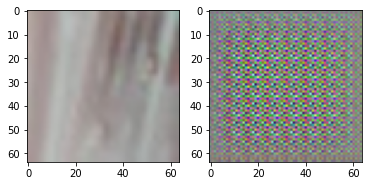

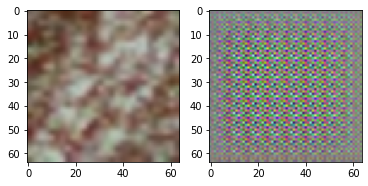

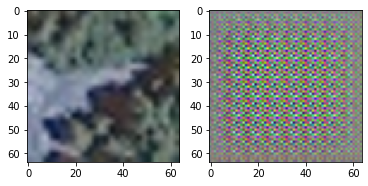

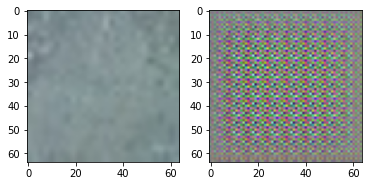

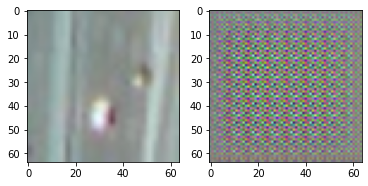

Epoch 2 - Train loss 0.00464 - Validation loss 0.00475                                    
Epoch 3 - Train loss 0.00445 - Validation loss 0.00485                                    
Epoch 4 - Train loss 0.00438 - Validation loss 0.00460                                    
Epoch 5 - Train loss 0.00434 - Validation loss 0.00433                                    
Epoch 6 - Train loss 0.00430 - Validation loss 0.00545                                    
Epoch 7 - Train loss 0.00417 - Validation loss 0.00416                                    
Epoch 8 - Train loss 0.00408 - Validation loss 0.00470                                    
Epoch 9 - Train loss 0.00405 - Validation loss 0.00421                                    
Epoch 10 - Train loss 0.00404 - Validation loss 0.00426                                    
Epoch 11 - Train loss 0.00400 - Validation loss 0.00404                                    


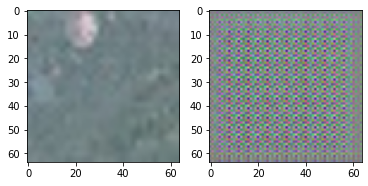

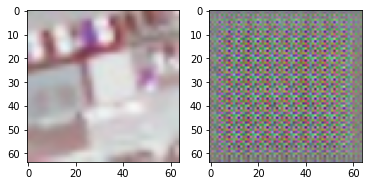

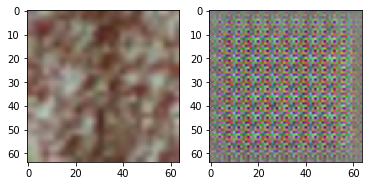

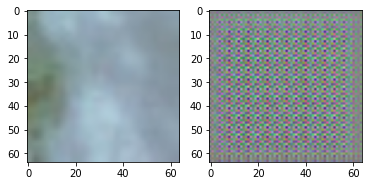

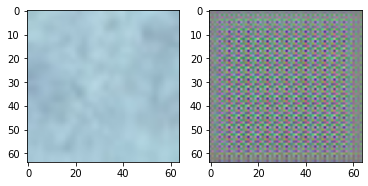

Epoch 12 - Train loss 0.00399 - Validation loss 0.00400                                    
Epoch 13 - Train loss 0.00400 - Validation loss 0.00428                                    
Epoch 14 - Train loss 0.00397 - Validation loss 0.00439                                    
Epoch 15 - Train loss 0.00396 - Validation loss 0.00451                                    
Epoch 16 - Train loss 0.00396 - Validation loss 0.00401                                    
Epoch 17 - Train loss 0.00394 - Validation loss 0.00405                                    
Epoch 18 - Train loss 0.00395 - Validation loss 0.00512                                    
Epoch 19 - Train loss 0.00394 - Validation loss 0.00397                                    
Epoch 20 - Train loss 0.00393 - Validation loss 0.00404                                    
Epoch 21 - Train loss 0.00392 - Validation loss 0.00404                                    


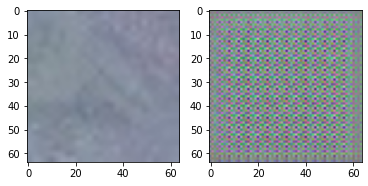

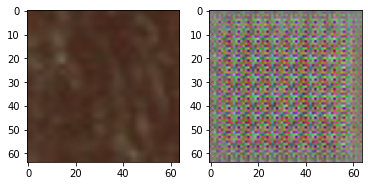

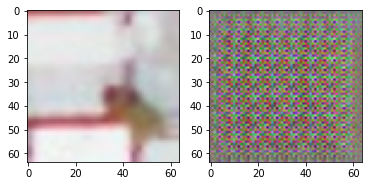

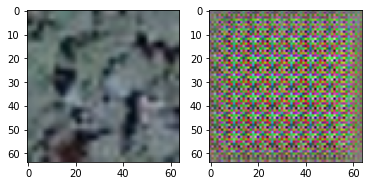

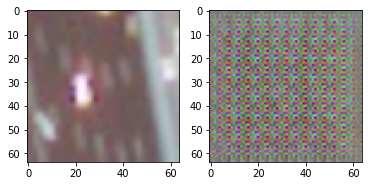

Epoch 22 - Train loss 0.00392 - Validation loss 0.00392                                    
Epoch 23 - Train loss 0.00391 - Validation loss 0.00408                                    
Epoch 24 - Train loss 0.00391 - Validation loss 0.00391                                    
Epoch 25 - Train loss 0.00391 - Validation loss 0.00395                                    
Epoch 26 - Train loss 0.00391 - Validation loss 0.00393                                    
Epoch 27 - Train loss 0.00389 - Validation loss 0.00391                                    
Epoch 28 - Train loss 0.00390 - Validation loss 0.00537                                    
Epoch 29 - Train loss 0.00389 - Validation loss 0.00399                                    
Epoch 30 - Train loss 0.00389 - Validation loss 0.00390                                    
Epoch 31 - Train loss 0.00389 - Validation loss 0.00410                                    


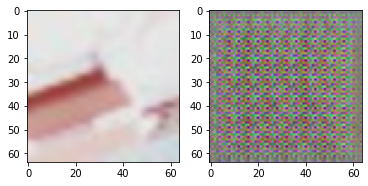

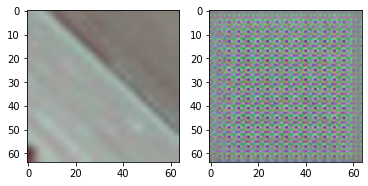

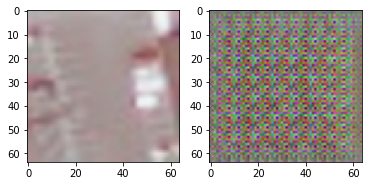

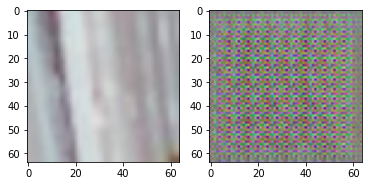

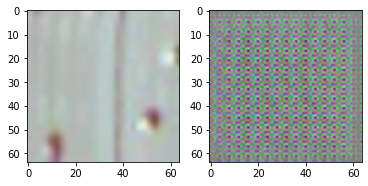

Starting autoencoder training. Best checkpoint stored in ./checkpoints
Epoch 1 - Train loss 0.00554 - Validation loss 0.00464                                    


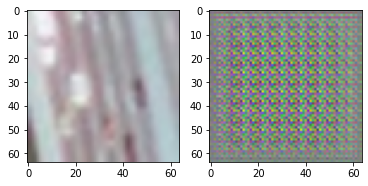

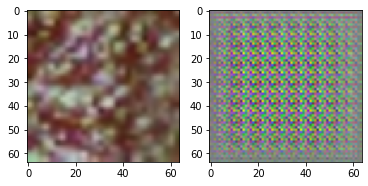

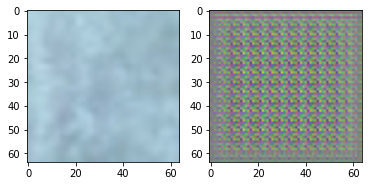

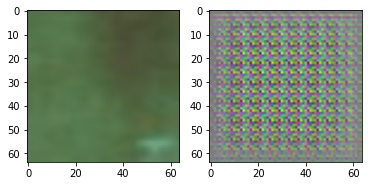

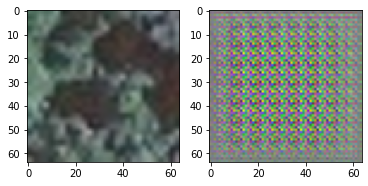

Epoch 2 - Train loss 0.00442 - Validation loss 0.00429                                    
Epoch 3 - Train loss 0.00428 - Validation loss 0.00430                                    
Epoch 4 - Train loss 0.00420 - Validation loss 0.00417                                    
Epoch 5 - Train loss 0.00415 - Validation loss 0.00412                                    
Epoch 6 - Train loss 0.00403 - Validation loss 0.00532                                    
Epoch 7 - Train loss 0.00388 - Validation loss 0.00385                                    
Epoch 8 - Train loss 0.00382 - Validation loss 0.00437                                    
Epoch 9 - Train loss 0.00380 - Validation loss 0.00398                                    
Epoch 10 - Train loss 0.00378 - Validation loss 0.00398                                    
Epoch 11 - Train loss 0.00375 - Validation loss 0.00378                                    


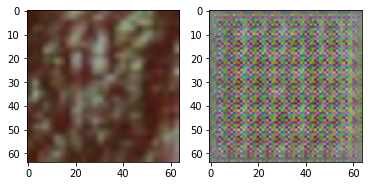

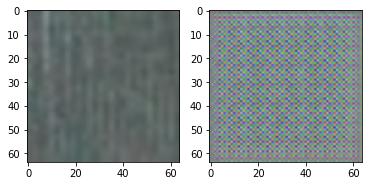

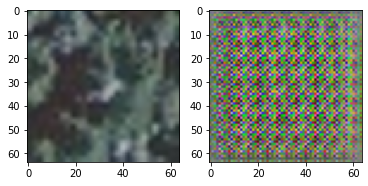

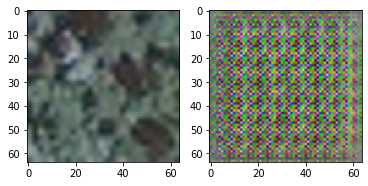

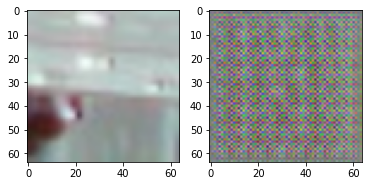

Epoch 12 - Train loss 0.00374 - Validation loss 0.00500                                    
Epoch 13 - Train loss 0.00373 - Validation loss 0.00374                                    
Epoch 14 - Train loss 0.00370 - Validation loss 0.00378                                    
Epoch 15 - Train loss 0.00370 - Validation loss 0.00410                                    
Epoch 16 - Train loss 0.00369 - Validation loss 0.00380                                    
Epoch 17 - Train loss 0.00368 - Validation loss 0.00387                                    
Epoch 18 - Train loss 0.00367 - Validation loss 0.00367                                    
Epoch 19 - Train loss 0.00366 - Validation loss 0.00371                                    
Epoch 20 - Train loss 0.00367 - Validation loss 0.00382                                    
Epoch 21 - Train loss 0.00366 - Validation loss 0.00434                                    


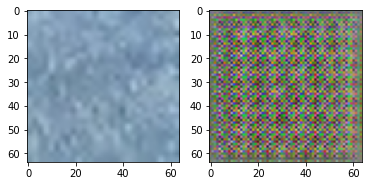

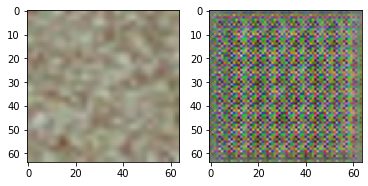

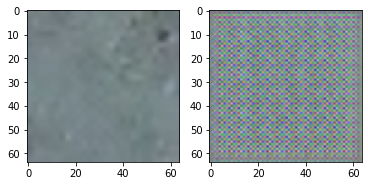

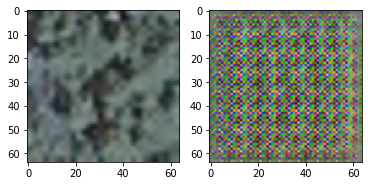

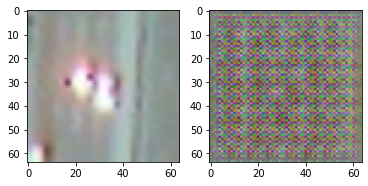

Epoch 22 - Train loss 0.00365 - Validation loss 0.00382                                    
Epoch 23 - Train loss 0.00363 - Validation loss 0.00362                                    
Epoch 24 - Train loss 0.00364 - Validation loss 0.00422                                    
Epoch 25 - Train loss 0.00364 - Validation loss 0.00370                                    
Epoch 26 - Train loss 0.00363 - Validation loss 0.00366                                    
Epoch 27 - Train loss 0.00363 - Validation loss 0.00370                                    
Epoch 28 - Train loss 0.00363 - Validation loss 0.00360                                    
Epoch 29 - Train loss 0.00363 - Validation loss 0.00394                                    
Epoch 30 - Train loss 0.00363 - Validation loss 0.00390                                    
Epoch 31 - Train loss 0.00361 - Validation loss 0.00366                                    


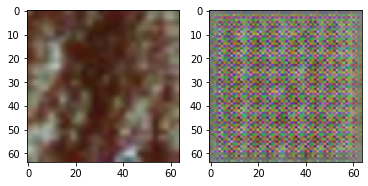

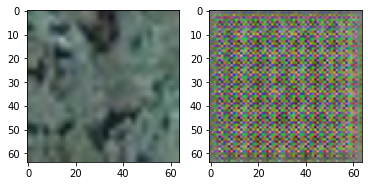

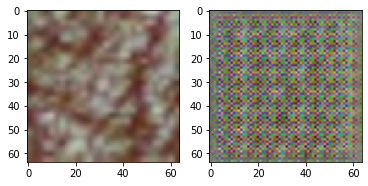

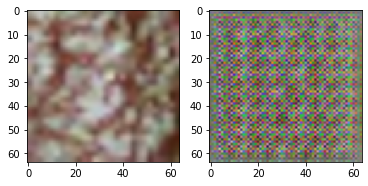

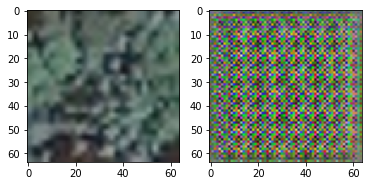

In [2]:
import time
import argparse
import os
import csv
from utility import run_training, run_epoch, fc_net, EarlyStopper
from VAE import FourLayerCVAE, train_autoencoder, encode_data
from perceptual_networks import SimpleExtractor, architecture_features
from perceptual_embedder import FeaturePredictorCVAE, FeatureAutoencoder, \
    PerceptualFeatureToImgCVAE, FeatureToImgCVAE
from main_pvae import extract_data, generate_autoencoders
args = argparse.ArgumentParser()
args.data = 'geo';                      args.data_path = 'C:/Project_Data/'
# AE
args.display_img_feat = 1  # false or epoch number to show >= num
args.ae_epochs = 31;                        args.ae_batch_size = 512;
args.ae_networks = ['FourLayerCVAE'];       args.ae_repetitions = 1;
args.ae_zs = [64, 128];                     args.ae_gammas = [0.01]
# Predictor
args.predictor_epochs = 2;              args.predictor_batch_size = 512;
args.predictor_repetitions = 1;
# Perceptual
args.perceptual_nets = ['alexnet'];        args.perceptual_layers = [5];
args.pretrained_path = './model_alexnet.pth'
# out_files
i = 0; fname = 'autoencoder_index_{:0>3d}.csv'
while os.path.exists(fname.format(i)): i += 1; args.autoencoder_index = fname.format(i)
i = 0; fname = 'results_{:0>3d}.csv'
while os.path.exists(fname.format(i)): i += 1; args.results_path = fname.format(i)

# Load autoencoder dataset, add code here to add new datasets
print('Loading data for autoencoder training...')
train_data, train_label, valid_data, valid_label, f_train, f_test = extract_data(args)

if True:
    print('dims of unlabeled data')
    print(train_data.shape)

# train_data, validation_data = split_data([data])

# Get autoencoder networks, add code here to add new autoencoders
networks = []
for network in args.ae_networks:
    if network == 'FourLayerCVAE':
        networks.append(FourLayerCVAE)
    elif network == 'FeaturePredictorCVAE':
        networks.append(FeaturePredictorCVAE)
    elif network == 'FeatureAutoencoder':
        networks.append(FeatureAutoencoder)
    elif network == 'PerceptualFeatureToImgCVAE':
        networks.append(PerceptualFeatureToImgCVAE)
    elif network == 'FeatureToImgCVAE':
        networks.append(FeatureToImgCVAE)
    else:
        raise ValueError(
            f'{network} does not match any known autoencoder'
        )

# Get perceptual networks, add code here to add new perceptual networks
perceptual_nets = []
for perceptual_net in args.perceptual_nets:
    if perceptual_net == 'None':
        perceptual_nets.append(None)
    elif perceptual_net in architecture_features:
        for layer in args.perceptual_layers:
            perceptual_nets.append(SimpleExtractor(perceptual_net, layer))
    else:
        raise ValueError(
            f'{perceptual_net} does not match any known perceptual net\n'
            'Select from: \n\t' + '\n\t'.join(architecture_features.keys())
        )

# Train the missing autoencoders
generate_autoencoders(
    index_file=args.autoencoder_index,
    dataset_name=args.data,
    data=(train_data, valid_data),
    epochs=args.ae_epochs,
    batch_size=args.ae_batch_size,
    networks=networks,
    z_dims=args.ae_zs,
    gammas=args.ae_gammas,
    perceptual_nets=perceptual_nets,
    repetitions=args.ae_repetitions,
    display_img_feat=args.display_img_feat
)

## B. Variational Autoencoder without perceptual module
### Training VAE - Showing random input image vs reconstructed image every 10 epochs 

Loading data for autoencoder training...
Loading data for autoencoder training...
dims of unlabeled data
torch.Size([26998, 3, 64, 64])
Creating a autoencoder index file at autoencoder_index_026.csv...
Starting autoencoder training. Best checkpoint stored in ./checkpoints
Epoch 1 - Train loss 0.03181 - Validation loss 0.01875                                    


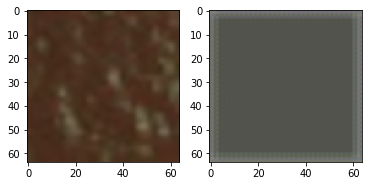

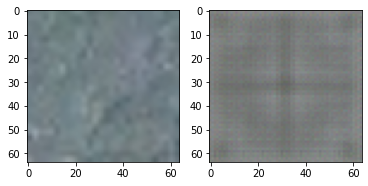

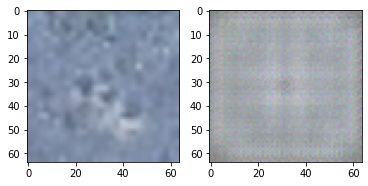

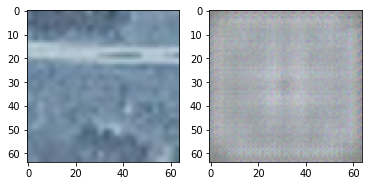

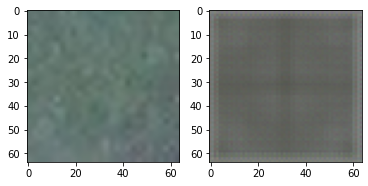

Epoch 2 - Train loss 0.01593 - Validation loss 0.01466                                    
Epoch 3 - Train loss 0.01380 - Validation loss 0.01271                                    
Epoch 4 - Train loss 0.01210 - Validation loss 0.01140                                    
Epoch 5 - Train loss 0.01126 - Validation loss 0.01091                                    
Epoch 6 - Train loss 0.01088 - Validation loss 0.01074                                    
Epoch 7 - Train loss 0.01053 - Validation loss 0.01000                                    
Epoch 8 - Train loss 0.01006 - Validation loss 0.00992                                    
Epoch 9 - Train loss 0.00997 - Validation loss 0.00977                                    
Epoch 10 - Train loss 0.00980 - Validation loss 0.00961                                    
Epoch 11 - Train loss 0.00962 - Validation loss 0.00940                                    


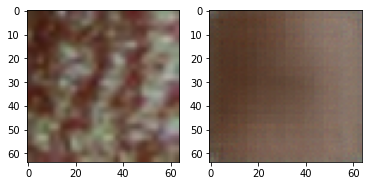

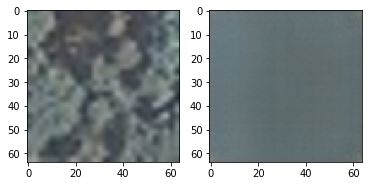

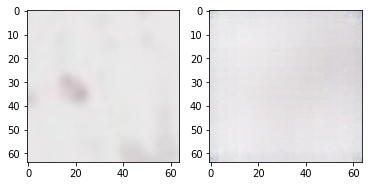

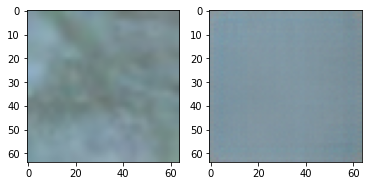

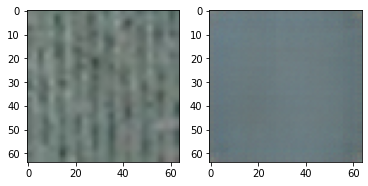

Epoch 12 - Train loss 0.00955 - Validation loss 0.00932                                    
Epoch 13 - Train loss 0.00957 - Validation loss 0.00945                                    
Epoch 14 - Train loss 0.00949 - Validation loss 0.00956                                    
Epoch 15 - Train loss 0.00949 - Validation loss 0.00946                                    
Epoch 16 - Train loss 0.00947 - Validation loss 0.00920                                    
Epoch 17 - Train loss 0.00937 - Validation loss 0.00917                                    
Epoch 18 - Train loss 0.00934 - Validation loss 0.00930                                    
Epoch 19 - Train loss 0.00936 - Validation loss 0.00914                                    
Epoch 20 - Train loss 0.00925 - Validation loss 0.00907                                    
Epoch 21 - Train loss 0.00924 - Validation loss 0.00909                                    


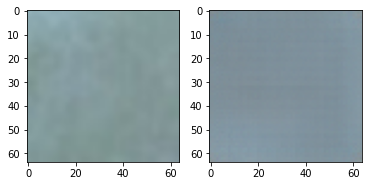

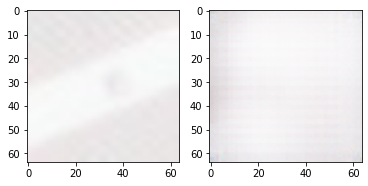

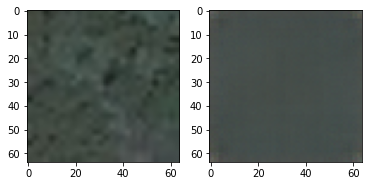

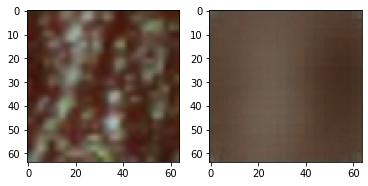

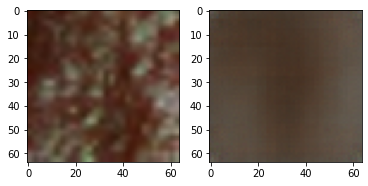

Epoch 22 - Train loss 0.00926 - Validation loss 0.00918                                    
Epoch 23 - Train loss 0.00922 - Validation loss 0.00911                                    
Epoch 24 - Train loss 0.00922 - Validation loss 0.00909                                    
Epoch 25 - Train loss 0.00920 - Validation loss 0.00902                                    
Epoch 26 - Train loss 0.00915 - Validation loss 0.00898                                    
Epoch 27 - Train loss 0.00905 - Validation loss 0.00890                                    
Epoch 28 - Train loss 0.00911 - Validation loss 0.00899                                    
Epoch 29 - Train loss 0.00909 - Validation loss 0.00904                                    
Epoch 30 - Train loss 0.00910 - Validation loss 0.00892                                    
Epoch 31 - Train loss 0.00901 - Validation loss 0.00901                                    


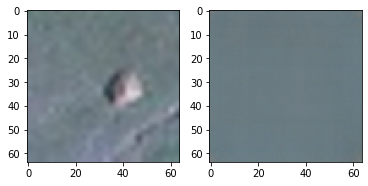

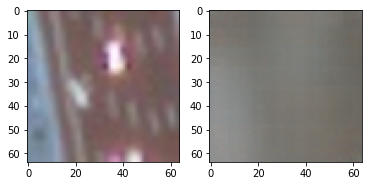

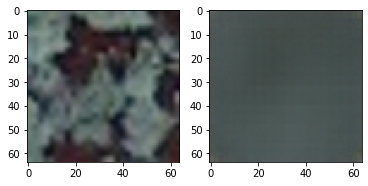

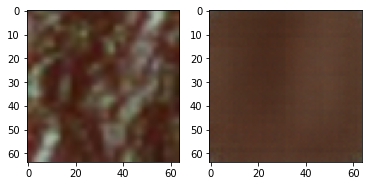

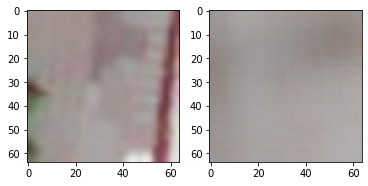

Epoch 32 - Train loss 0.00905 - Validation loss 0.00896                                    
Epoch 33 - Train loss 0.00906 - Validation loss 0.00888                                    
Epoch 34 - Train loss 0.00902 - Validation loss 0.00887                                    
Epoch 35 - Train loss 0.00897 - Validation loss 0.00883                                    
Epoch 36 - Train loss 0.00898 - Validation loss 0.00887                                    
Epoch 37 - Train loss 0.00891 - Validation loss 0.00889                                    
Epoch 38 - Train loss 0.00901 - Validation loss 0.00915                                    
Epoch 39 - Train loss 0.00900 - Validation loss 0.00909                                    
Epoch 40 - Train loss 0.00899 - Validation loss 0.00892                                    
Epoch 41 - Train loss 0.00894 - Validation loss 0.00881                                    


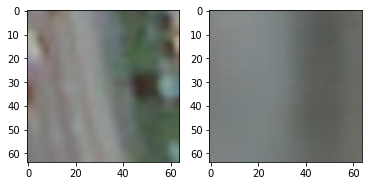

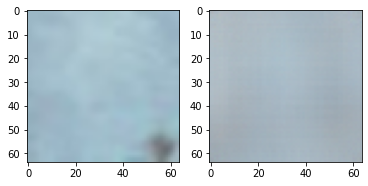

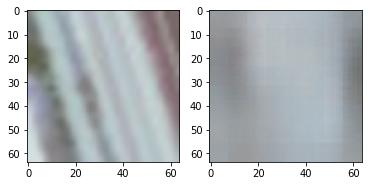

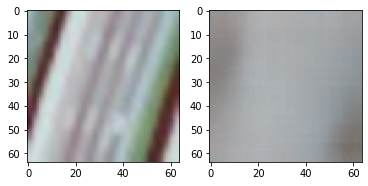

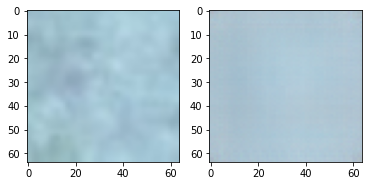

Epoch 42 - Train loss 0.00895 - Validation loss 0.00879                                    
Epoch 43 - Train loss 0.00890 - Validation loss 0.00878                                    
Epoch 44 - Train loss 0.00903 - Validation loss 0.00899                                    
Epoch 45 - Train loss 0.00891 - Validation loss 0.00887                                    
Epoch 46 - Train loss 0.00891 - Validation loss 0.00873                                    
Epoch 47 - Train loss 0.00897 - Validation loss 0.00914                                    
Epoch 48 - Train loss 0.00896 - Validation loss 0.00881                                    
Epoch 49 - Train loss 0.00889 - Validation loss 0.00868                                    
Epoch 50 - Train loss 0.00886 - Validation loss 0.00908                                    
Epoch 51 - Train loss 0.00886 - Validation loss 0.00892                                    


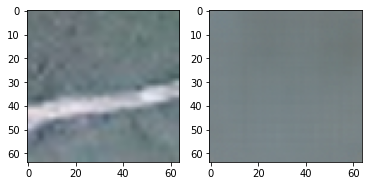

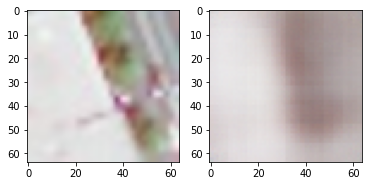

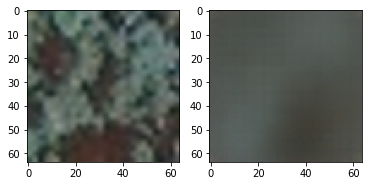

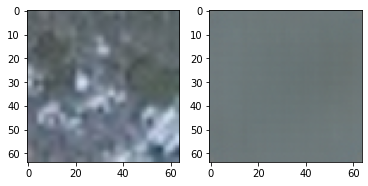

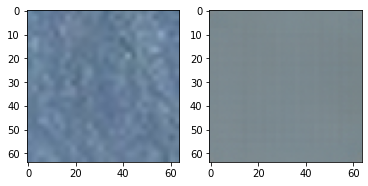

Epoch 52 - Train loss 0.00887 - Validation loss 0.00877                                    
Epoch 53 - Train loss 0.00883 - Validation loss 0.00880                                    
Epoch 54 - Train loss 0.00892 - Validation loss 0.00888                                    
Epoch 55 - Train loss 0.00885 - Validation loss 0.00867                                    
Epoch 56 - Train loss 0.00879 - Validation loss 0.00887                                    
Epoch 57 - Train loss 0.00881 - Validation loss 0.00870                                    
Epoch 58 - Train loss 0.00882 - Validation loss 0.00868                                    
Epoch 59 - Train loss 0.00882 - Validation loss 0.00883                                    
Epoch 60 - Train loss 0.00883 - Validation loss 0.00877                                    
Epoch 61 - Train loss 0.00884 - Validation loss 0.00878                                    


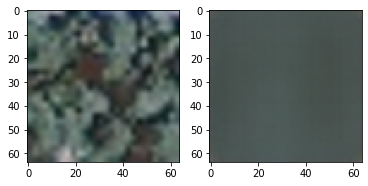

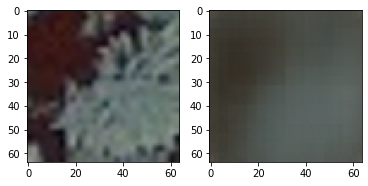

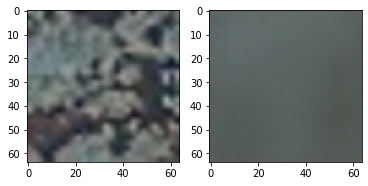

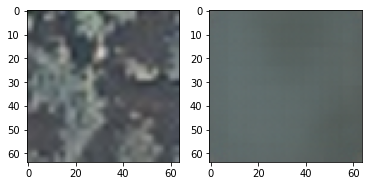

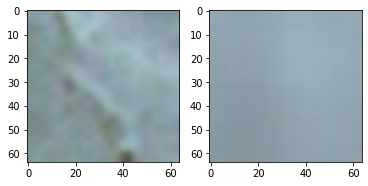

Epoch 62 - Train loss 0.00882 - Validation loss 0.00868                                    
Epoch 63 - Train loss 0.00880 - Validation loss 0.00880                                    
Epoch 64 - Train loss 0.00879 - Validation loss 0.00874                                    
Epoch 65 - Train loss 0.00883 - Validation loss 0.00893                                    
Starting autoencoder training. Best checkpoint stored in ./checkpoints
Epoch 1 - Train loss 0.02307 - Validation loss 0.01585                                    


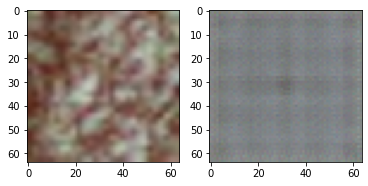

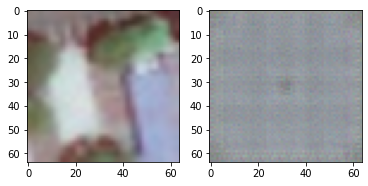

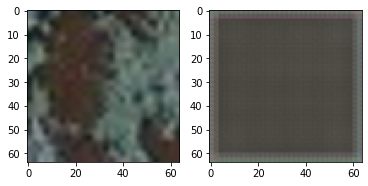

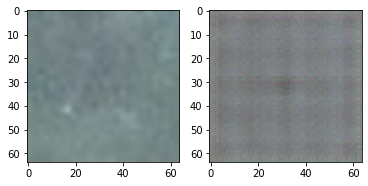

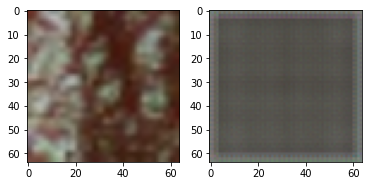

Epoch 2 - Train loss 0.01391 - Validation loss 0.01251                                    
Epoch 3 - Train loss 0.01203 - Validation loss 0.01139                                    
Epoch 4 - Train loss 0.01090 - Validation loss 0.01040                                    
Epoch 5 - Train loss 0.01014 - Validation loss 0.00949                                    
Epoch 6 - Train loss 0.00950 - Validation loss 0.00916                                    
Epoch 7 - Train loss 0.00900 - Validation loss 0.00873                                    
Epoch 8 - Train loss 0.00878 - Validation loss 0.00863                                    
Epoch 9 - Train loss 0.00879 - Validation loss 0.00902                                    
Epoch 10 - Train loss 0.00847 - Validation loss 0.00876                                    
Epoch 11 - Train loss 0.00847 - Validation loss 0.00827                                    


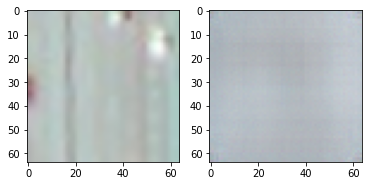

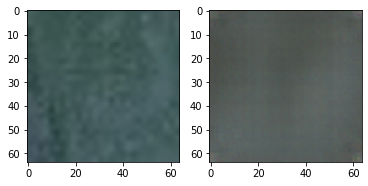

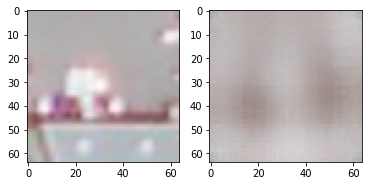

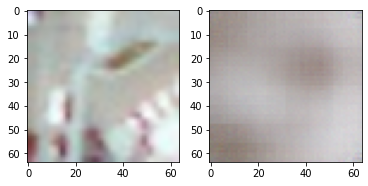

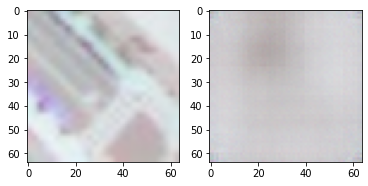

Epoch 12 - Train loss 0.00826 - Validation loss 0.00801                                    
Epoch 13 - Train loss 0.00813 - Validation loss 0.00798                                    
Epoch 14 - Train loss 0.00812 - Validation loss 0.00802                                    
Epoch 15 - Train loss 0.00804 - Validation loss 0.00783                                    
Epoch 16 - Train loss 0.00798 - Validation loss 0.00789                                    
Epoch 17 - Train loss 0.00806 - Validation loss 0.00786                                    
Epoch 18 - Train loss 0.00798 - Validation loss 0.00778                                    
Epoch 19 - Train loss 0.00791 - Validation loss 0.00792                                    
Epoch 20 - Train loss 0.00793 - Validation loss 0.00769                                    
Epoch 21 - Train loss 0.00784 - Validation loss 0.00778                                    


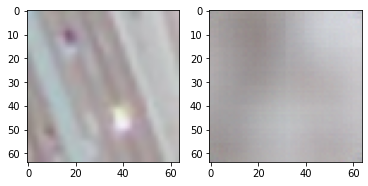

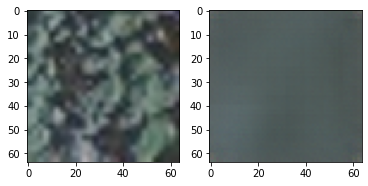

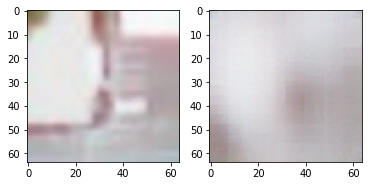

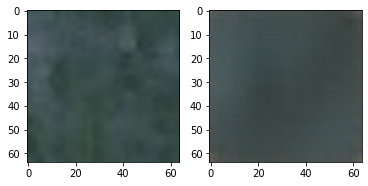

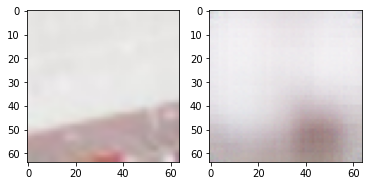

Epoch 22 - Train loss 0.00786 - Validation loss 0.00772                                    
Epoch 23 - Train loss 0.00785 - Validation loss 0.00790                                    
Epoch 24 - Train loss 0.00784 - Validation loss 0.00781                                    
Epoch 25 - Train loss 0.00783 - Validation loss 0.00768                                    
Epoch 26 - Train loss 0.00774 - Validation loss 0.00765                                    
Epoch 27 - Train loss 0.00774 - Validation loss 0.00791                                    
Epoch 28 - Train loss 0.00776 - Validation loss 0.00785                                    
Epoch 29 - Train loss 0.00772 - Validation loss 0.00756                                    
Epoch 30 - Train loss 0.00772 - Validation loss 0.00762                                    
Epoch 31 - Train loss 0.00768 - Validation loss 0.00753                                    


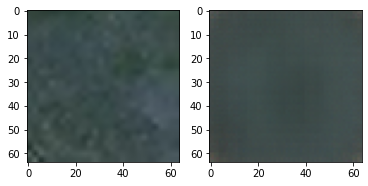

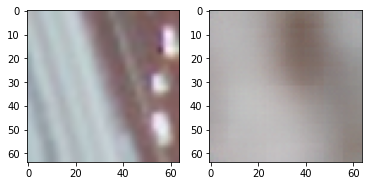

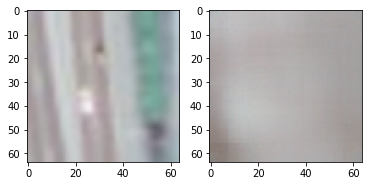

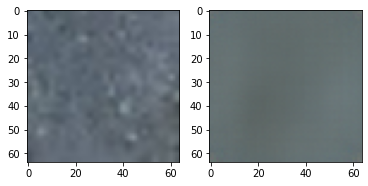

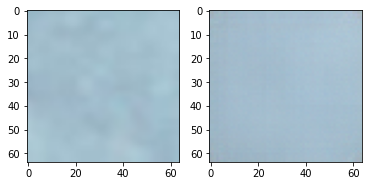

Epoch 32 - Train loss 0.00772 - Validation loss 0.00754                                    
Epoch 33 - Train loss 0.00766 - Validation loss 0.00767                                    
Epoch 34 - Train loss 0.00764 - Validation loss 0.00753                                    
Epoch 35 - Train loss 0.00762 - Validation loss 0.00758                                    
Epoch 36 - Train loss 0.00765 - Validation loss 0.00763                                    
Epoch 37 - Train loss 0.00759 - Validation loss 0.00748                                    
Epoch 38 - Train loss 0.00760 - Validation loss 0.00744                                    
Epoch 39 - Train loss 0.00756 - Validation loss 0.00787                                    
Epoch 40 - Train loss 0.00758 - Validation loss 0.00747                                    
Epoch 41 - Train loss 0.00758 - Validation loss 0.00750                                    


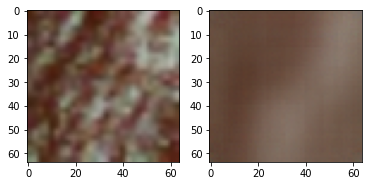

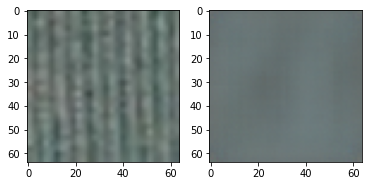

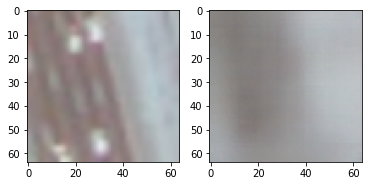

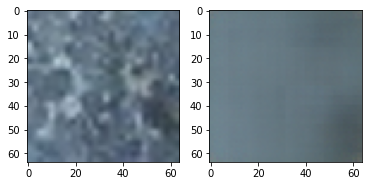

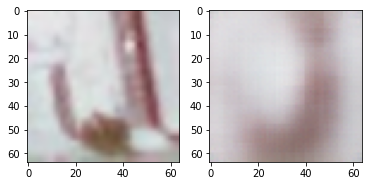

Epoch 42 - Train loss 0.00757 - Validation loss 0.00741                                    
Epoch 43 - Train loss 0.00758 - Validation loss 0.00756                                    
Epoch 44 - Train loss 0.00758 - Validation loss 0.00739                                    
Epoch 45 - Train loss 0.00754 - Validation loss 0.00737                                    
Epoch 46 - Train loss 0.00750 - Validation loss 0.00771                                    
Epoch 47 - Train loss 0.00754 - Validation loss 0.00763                                    
Epoch 48 - Train loss 0.00750 - Validation loss 0.00737                                    
Epoch 49 - Train loss 0.00746 - Validation loss 0.00751                                    
Epoch 50 - Train loss 0.00749 - Validation loss 0.00739                                    
Epoch 51 - Train loss 0.00749 - Validation loss 0.00754                                    


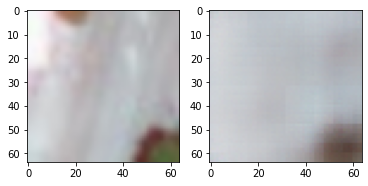

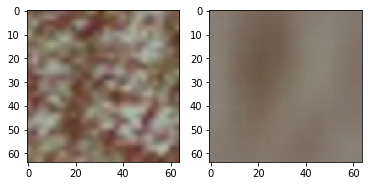

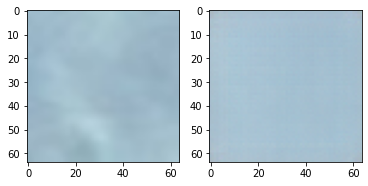

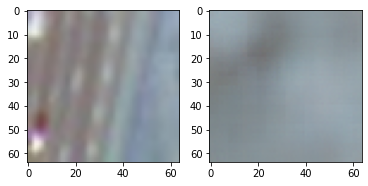

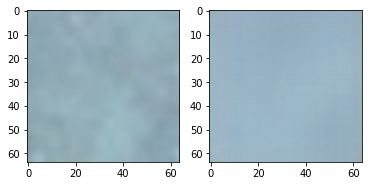

Epoch 52 - Train loss 0.00750 - Validation loss 0.00732                                    
Epoch 53 - Train loss 0.00751 - Validation loss 0.00741                                    
Epoch 54 - Train loss 0.00747 - Validation loss 0.00762                                    
Epoch 55 - Train loss 0.00752 - Validation loss 0.00732                                    
Epoch 56 - Train loss 0.00743 - Validation loss 0.00731                                    
Epoch 57 - Train loss 0.00742 - Validation loss 0.00739                                    
Epoch 58 - Train loss 0.00742 - Validation loss 0.00731                                    
Epoch 59 - Train loss 0.00742 - Validation loss 0.00734                                    
Epoch 60 - Train loss 0.00739 - Validation loss 0.00733                                    
Epoch 61 - Train loss 0.00738 - Validation loss 0.00730                                    


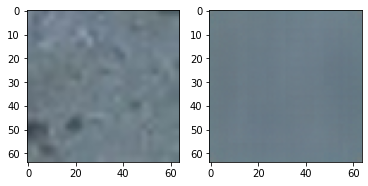

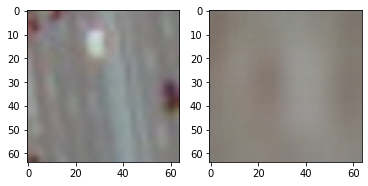

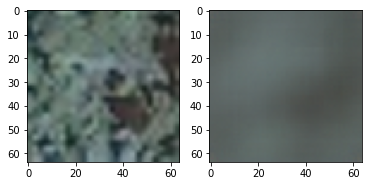

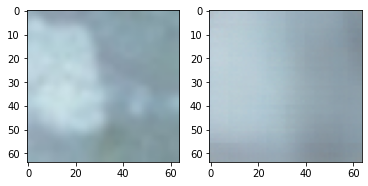

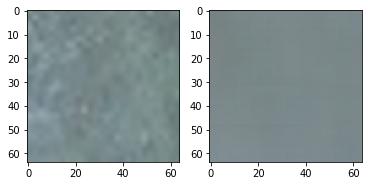

Epoch 62 - Train loss 0.00738 - Validation loss 0.00737                                    
Epoch 63 - Train loss 0.00738 - Validation loss 0.00737                                    
Epoch 64 - Train loss 0.00737 - Validation loss 0.00739                                    
Epoch 65 - Train loss 0.00742 - Validation loss 0.00741                                    
Epoch 66 - Train loss 0.00736 - Validation loss 0.00737                                    
Epoch 67 - Train loss 0.00734 - Validation loss 0.00732                                    
Epoch 68 - Train loss 0.00740 - Validation loss 0.00732                                    
Epoch 69 - Train loss 0.00738 - Validation loss 0.00740                                    
Epoch 70 - Train loss 0.00737 - Validation loss 0.00736                                    
Epoch 71 - Train loss 0.00736 - Validation loss 0.00722                                    


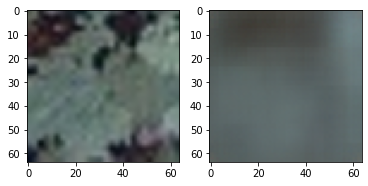

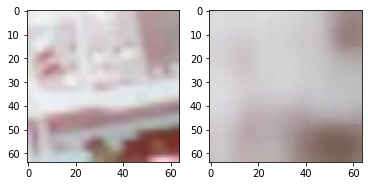

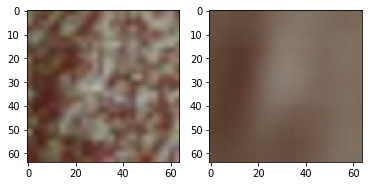

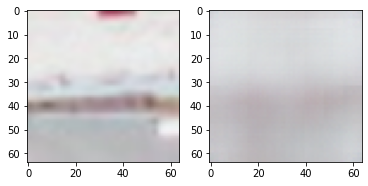

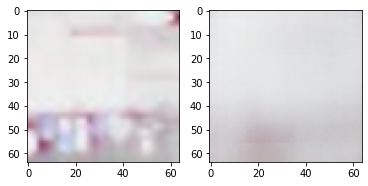

Epoch 72 - Train loss 0.00731 - Validation loss 0.00722                                    
Epoch 73 - Train loss 0.00733 - Validation loss 0.00725                                    
Epoch 74 - Train loss 0.00731 - Validation loss 0.00745                                    
Epoch 75 - Train loss 0.00735 - Validation loss 0.00738                                    
Epoch 76 - Train loss 0.00737 - Validation loss 0.00732                                    
Epoch 77 - Train loss 0.00730 - Validation loss 0.00731                                    
Epoch 78 - Train loss 0.00734 - Validation loss 0.00731                                    
Epoch 79 - Train loss 0.00737 - Validation loss 0.00732                                    
Epoch 80 - Train loss 0.00733 - Validation loss 0.00724                                    
Epoch 81 - Train loss 0.00733 - Validation loss 0.00737                                    


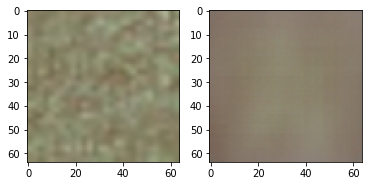

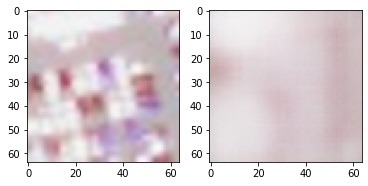

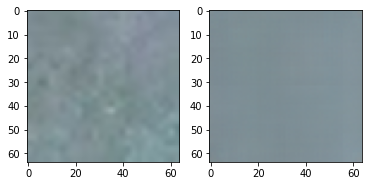

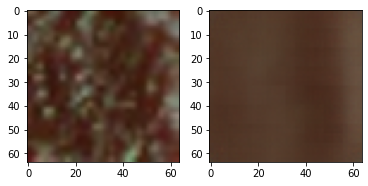

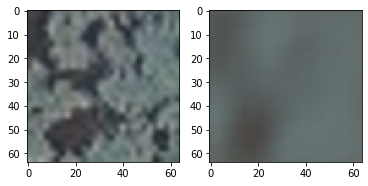

Epoch 82 - Train loss 0.00729 - Validation loss 0.00721                                    
Epoch 83 - Train loss 0.00728 - Validation loss 0.00722                                    
Epoch 84 - Train loss 0.00726 - Validation loss 0.00722                                    
Epoch 85 - Train loss 0.00727 - Validation loss 0.00728                                    
Epoch 86 - Train loss 0.00728 - Validation loss 0.00726                                    
Epoch 87 - Train loss 0.00729 - Validation loss 0.00718                                    
Epoch 88 - Train loss 0.00729 - Validation loss 0.00735                                    
Epoch 89 - Train loss 0.00727 - Validation loss 0.00718                                    
Epoch 90 - Train loss 0.00726 - Validation loss 0.00722                                    
Epoch 91 - Train loss 0.00729 - Validation loss 0.00722                                    


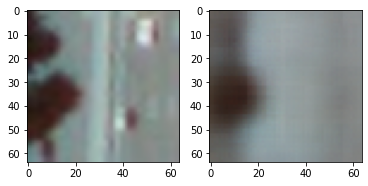

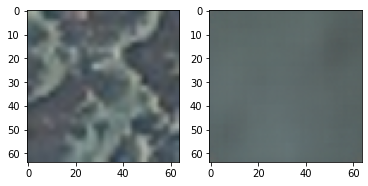

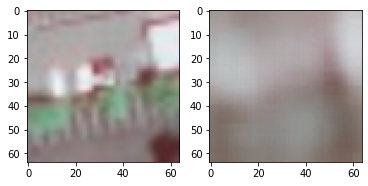

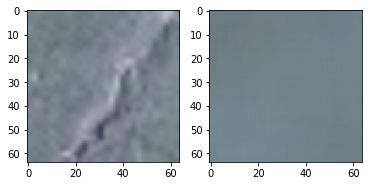

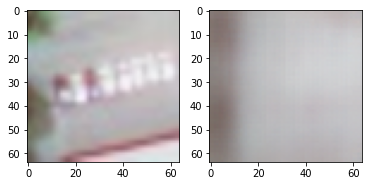

Epoch 92 - Train loss 0.00722 - Validation loss 0.00723                                    
Epoch 93 - Train loss 0.00728 - Validation loss 0.00730                                    
Epoch 94 - Train loss 0.00720 - Validation loss 0.00716                                    
Epoch 95 - Train loss 0.00730 - Validation loss 0.00732                                    
Epoch 96 - Train loss 0.00724 - Validation loss 0.00738                                    
Epoch 97 - Train loss 0.00724 - Validation loss 0.00721                                    
Epoch 98 - Train loss 0.00724 - Validation loss 0.00731                                    
Epoch 99 - Train loss 0.00725 - Validation loss 0.00719                                    
Epoch 100 - Train loss 0.00725 - Validation loss 0.00720                                    
Epoch 101 - Train loss 0.00725 - Validation loss 0.00719                                    


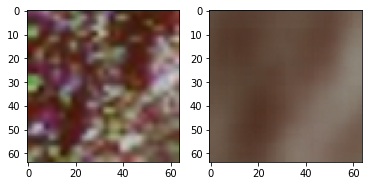

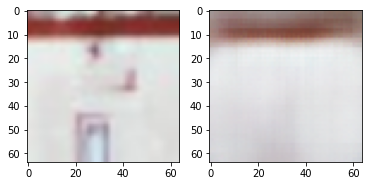

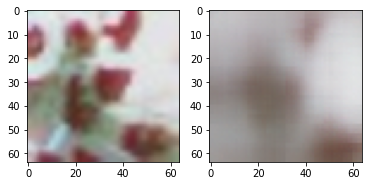

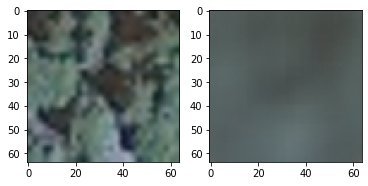

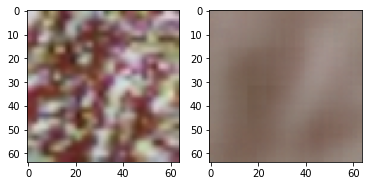

In [5]:
import time
import argparse
import os
import csv
from utility import run_training, run_epoch, fc_net, EarlyStopper
from VAE import FourLayerCVAE, train_autoencoder, encode_data
from perceptual_networks import SimpleExtractor, architecture_features
from perceptual_embedder import FeaturePredictorCVAE, FeatureAutoencoder, \
    PerceptualFeatureToImgCVAE, FeatureToImgCVAE
from main_pvae import extract_data, generate_autoencoders
args = argparse.ArgumentParser()
args.data = 'geo';                      args.data_path = 'C:/Project_Data/'
# AE
args.display_img_feat = 1  # false or epoch number to show >= num
args.ae_epochs = 101;                        args.ae_batch_size = 512;
args.ae_networks = ['FourLayerCVAE'];       args.ae_repetitions = 1;
args.ae_zs = [64, 128];                     args.ae_gammas = [0.01]
# Predictor
args.predictor_epochs = 2;              args.predictor_batch_size = 512;
args.predictor_repetitions = 1;
# Perceptual
args.perceptual_nets = ['None'];        args.perceptual_layers = [5];
args.pretrained_path = './model_alexnet.pth'
# out_files
i = 0; fname = 'autoencoder_index_{:0>3d}.csv'
while os.path.exists(fname.format(i)): i += 1; args.autoencoder_index = fname.format(i)
i = 0; fname = 'results_{:0>3d}.csv'
while os.path.exists(fname.format(i)): i += 1; args.results_path = fname.format(i)

# Load autoencoder dataset, add code here to add new datasets
print('Loading data for autoencoder training...')
train_data, train_label, valid_data, valid_label, f_train, f_test = extract_data(args)

# Load autoencoder dataset, add code here to add new datasets
print('Loading data for autoencoder training...')
train_data, train_label, valid_data, valid_label, f_train, f_test = extract_data(args)

if True:
    print('dims of unlabeled data')
    print(train_data.shape)

# train_data, validation_data = split_data([data])

# Get autoencoder networks, add code here to add new autoencoders
networks = []
for network in args.ae_networks:
    if network == 'FourLayerCVAE':
        networks.append(FourLayerCVAE)
    elif network == 'FeaturePredictorCVAE':
        networks.append(FeaturePredictorCVAE)
    elif network == 'FeatureAutoencoder':
        networks.append(FeatureAutoencoder)
    elif network == 'PerceptualFeatureToImgCVAE':
        networks.append(PerceptualFeatureToImgCVAE)
    elif network == 'FeatureToImgCVAE':
        networks.append(FeatureToImgCVAE)
    else:
        raise ValueError(
            f'{network} does not match any known autoencoder'
        )

# Get perceptual networks, add code here to add new perceptual networks
perceptual_nets = []
for perceptual_net in args.perceptual_nets:
    if perceptual_net == 'None':
        perceptual_nets.append(None)
    elif perceptual_net in architecture_features:
        for layer in args.perceptual_layers:
            perceptual_nets.append(SimpleExtractor(perceptual_net, layer))
    else:
        raise ValueError(
            f'{perceptual_net} does not match any known perceptual net\n'
            'Select from: \n\t' + '\n\t'.join(architecture_features.keys())
        )

# Train the missing autoencoders
generate_autoencoders(
    index_file=args.autoencoder_index,
    dataset_name=args.data,
    data=(train_data, valid_data),
    epochs=args.ae_epochs,
    batch_size=args.ae_batch_size,
    networks=networks,
    z_dims=args.ae_zs,
    gammas=args.ae_gammas,
    perceptual_nets=perceptual_nets,
    repetitions=args.ae_repetitions,
    display_img_feat=args.display_img_feat
)

##### Load the predictor training and testing data, code here to add dataset

In [3]:
# Load the predictor training and testing data, code here to add dataset
autoencoder_path='checkpoints/FourLayerCVAE_2021-01-14_12h23m16s.pt'
data, labels, test_data, test_labels = extract_pred_data()
if True:
    print('dims of train and test')
    print(data.shape)
    print(labels.shape)
    print(test_data.shape)
    print(test_labels.shape)

train_data, validation_data = split_data([data, labels])
test_data = (test_data, test_labels)
train_encoded, val_encoded, test_encoded = embedding(
            train_data=train_data,  validation_data=validation_data,
            test_data=test_data,    batch_size=args.predictor_batch_size,
            autoencoder_path=autoencoder_path)


dims of train and test
torch.Size([10499, 3, 64, 64])
torch.Size([10499, 6])
torch.Size([4500, 3, 64, 64])
torch.Size([4500, 6])


In [4]:
print(train_encoded.shape)
print(val_encoded.shape)
print(test_encoded.shape)

torch.Size([8399, 128])
torch.Size([2099, 128])
torch.Size([4500, 128])


## C. Transfer learning using VGG19bn model (Supervised approach)
### Training VGG19bn

In [ ]:
import torch
import torchvision
from torch.nn import functional as F
from sklearn.metrics import accuracy_score
from sklearn.metrics.pairwise import cosine_similarity
from sklearn.model_selection import train_test_split
from torch.utils.data import Dataset, DataLoader
import torchvision.transforms as transforms
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from torch.utils.tensorboard import SummaryWriter
import time
import argparse
import os
import csv
import numpy as np
import torch.nn as nn
from torch.utils.data import TensorDataset, DataLoader
from itertools import combinations_with_replacement, product
import torch
from main_pvae import extract_data

args = argparse.ArgumentParser()
# Namespace(ae_batch_size=512, ae_epochs=50, ae_gammas=[0.0, 0.01], ae_networks=['FourLayerCVAE'], ae_repetitions=1,
#           ae_zs=[64, 128], autoencoder_index='autoencoder_index.csv', data='svhn', perceptual_layers=[5],
#           perceptual_nets=['None', 'alexnet'], predictor_batch_size=512, predictor_epochs=500,
#           predictor_repetitions=1, results_path='results.csv')
args.data = 'geo';                      args.data_path = 'C:/Project_Data/'
# AE
args.display_img_feat = 1  # false or epoch number to show >= num
args.ae_epochs = 50;                        args.ae_batch_size = 512;
args.ae_networks = ['FourLayerCVAE'];       args.ae_repetitions = 1;
args.ae_zs = [64, 128];                     args.ae_gammas = [0.01]
# Predictor
args.predictor_epochs = 2;              args.predictor_batch_size = 512;
args.predictor_repetitions = 1;
# Perceptual
args.perceptual_nets = ['None'];        args.perceptual_layers = [5];
# out_files
i = 0; fname = 'autoencoder_index_{:0>3d}.csv'
while os.path.exists(fname.format(i)): i += 1; args.autoencoder_index = fname.format(i)
i = 0; fname = 'results_{:0>3d}.csv'
while os.path.exists(fname.format(i)): i += 1; args.results_path = fname.format(i)

model = torchvision.models.vgg19_bn(pretrained=False, progress=True)
# make a 6-class classifier
mod = list(model.classifier.children())
mod.pop();
mod.append(torch.nn.Linear(4096, 6))
new_classifier = torch.nn.Sequential(*mod)
model.classifier = new_classifier

gpu=True

def visualize(model, input_size=(3, 224, 224)):
    '''Visualize the input size though the layers of the model'''
    x = torch.zeros(input_size).unsqueeze_(dim=0)
    print(x.size())
    for layer in list(model.features) + list(model.avgpool) + list(model.classifier):
        x = layer(x)
        print(x.size())

### https://stackoverflow.com/questions/49433936/how-to-initialize-weights-in-pytorch
## takes in a module and applies the specified weight initialization
def weights_init_normal(m):
    '''Takes in a module and initializes all linear layers with weight
       values taken from a normal distribution.'''

    classname = m.__class__.__name__
    # for every Linear layer in a model
    if classname.find('Linear') != -1:
        y = m.in_features
        # m.weight.data shoud be taken from a normal distribution
        m.weight.data.normal_(0.0, 1 / np.sqrt(y))
        # m.bias.data should be 0
        m.bias.data.fill_(0)

# takes in a module and applies the specified weight initialization
def weights_init_uniform_rule(m):
    classname = m.__class__.__name__
    # for every Linear layer in a model..
    if classname.find('Linear') != -1:
        # get the number of the inputs
        n = m.in_features
        y = 1.0 / np.sqrt(n)
        m.weight.data.uniform_(-y, y)
        m.bias.data.fill_(0)

def loss(output, x):
    x = x.reshape(x.size(0), -1)
    rec_x = output.view(x.size(0), -1)
    REC = F.mse_loss(rec_x, x, reduction='mean')
    return [REC]

model.apply(weights_init_uniform_rule)
loss_func = nn.CrossEntropyLoss()

lr = .00005
optimizer = torch.optim.Adam(model.parameters(), lr=lr)
if gpu:
    model.cuda()
    loss_func.cuda()
batch_size = args.ae_batch_size
batch_size = 128

class PAEDataLoader(Dataset):
    def __init__(self, root_dir, transform=None, train=True):
        """
        Args:
            root_dir (string): Directory with all the images.
            transform (callable, optional): Optional transform to be applied
                on a sample.
        """
        self.root_dir = root_dir
        self.transform = transform
        self.train = train


    def __len__(self):
        return len(self.img_names)

    def __getitem__(self, idx):
        image = mpimg.imread(self.img_names[idx])
        label = self.labels[idx]
        if self.transform:
            image = self.transform(image)

        return image, label
train_transform = transforms.Compose([
    transforms.ToPILImage(),
    transforms.RandomHorizontalFlip(0.5),
    transforms.RandomVerticalFlip(0.5),
    # transforms.RandomRotation(degrees=(0,360)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.5080, 0.5196, 0.5195],
                         std=[0.1852, 0.1995, 0.2193])])

test_transform = transforms.Compose([
    transforms.ToPILImage(),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.5080, 0.5196, 0.5195],
                         std=[0.1852, 0.1995, 0.2193])])

train_data, train_labels, valid_data, valid_labels, _, _ = extract_data(args)
train_data = TensorDataset(train_data, train_labels)
trainloader = DataLoader(train_data, batch_size, shuffle=True)
valid_data = TensorDataset(valid_data, valid_labels)
validloader = DataLoader(valid_data, batch_size, shuffle=True)

def run_epoch(dataloader, loss, train, epoch_name, gpu=True):
    start_time = time.time()
    epoch_losses = []
    accuracy_epoch = []
    for batch_id, (batch_data, batch_labels) in enumerate(dataloader):
        if train:
            model.train()
        else:
            model.eval()
        if gpu:
            batch_data = batch_data.cuda()
            batch_labels = batch_labels.cuda()
        optimizer.zero_grad()
        output = model(batch_data)

        preds = torch.max(output, 1)[1]
        accuracy = accuracy_score(preds.cpu(), torch.max(batch_labels.cpu(), 1)[1])
        losses = loss_func(output, torch.max(batch_labels, 1)[1])
        losses.backward()
        epoch_losses.append(losses.item())
        if train:
            optimizer.step()
        print(
            '\r{} - [{}/{}] - Losses: {}, Accuracy: {:.2%}, Time elapsed: {}s'.format(
                epoch_name, batch_id + 1, len(dataloader),
                ''.join('{0:.5f}'.format(losses)), accuracy,
                '{0:.1f}'.format(time.time() - start_time)
            ), end=''
        )
        accuracy_epoch.append(accuracy)
    avg_acc_epoch = np.mean(accuracy_epoch)
    print('\tAverage Accuracy {}: {:.2%}'.format(epoch_name, avg_acc_epoch))
    return avg_acc_epoch

for epoch in range(1, args.ae_epochs+1):
    train_acc_epoch = run_epoch(dataloader=trainloader, loss=loss, train=True,
                         epoch_name='Train EPOCH {}'.format(epoch))
    # writer.add_scalar("Train_accuracy", train_acc_epoch, epoch)

    val_acc_epoch = run_epoch(dataloader=validloader, loss=loss, train=False,
                         epoch_name='Val   EPOCH {}'.format(epoch))
    # writer.add_scalar("Test_accuracy", val_acc_epoch, epoch)


    # print(
    #     f'\rEpoch {epoch} - '
    #     f'Train loss {training_losses[0]:.5f} - '
    #     f'Validation loss {validation_losses[0]:.5f}',
    #     ' ' * 35
    # )
# writer.flush()
torch.save(model.state_dict(), 'model_vgg19bn.pth')

Train EPOCH 1 - [211/211] - Losses: 0.03123, Accuracy: 99.15%, Time elapsed: 211.3s	Average Accuracy Train EPOCH 1: 92.13%
Val   EPOCH 1 - [24/24] - Losses: 0.16377, Accuracy: 92.86%, Time elapsed: 21.1s	Average Accuracy Val   EPOCH 1: 96.25%
Train EPOCH 2 - [211/211] - Losses: 0.02081, Accuracy: 99.15%, Time elapsed: 211.0s	Average Accuracy Train EPOCH 2: 97.01%
Val   EPOCH 2 - [24/24] - Losses: 0.20720, Accuracy: 94.64%, Time elapsed: 21.2s	Average Accuracy Val   EPOCH 2: 95.35%
Train EPOCH 3 - [211/211] - Losses: 0.06377, Accuracy: 97.46%, Time elapsed: 210.7s	Average Accuracy Train EPOCH 3: 97.76%
Val   EPOCH 3 - [24/24] - Losses: 0.00320, Accuracy: 100.00%, Time elapsed: 21.2s	Average Accuracy Val   EPOCH 3: 97.27%
Train EPOCH 4 - [211/211] - Losses: 0.04391, Accuracy: 97.46%, Time elapsed: 210.5s	Average Accuracy Train EPOCH 4: 98.24%
Val   EPOCH 4 - [24/24] - Losses: 0.01065, Accuracy: 100.00%, Time elapsed: 21.3s	Average Accuracy Val   EPOCH 4: 98.67%
Train EPOCH 5 - [211/211] 